 <h1><center>M5 : Future Sales Prediction</center></h1>

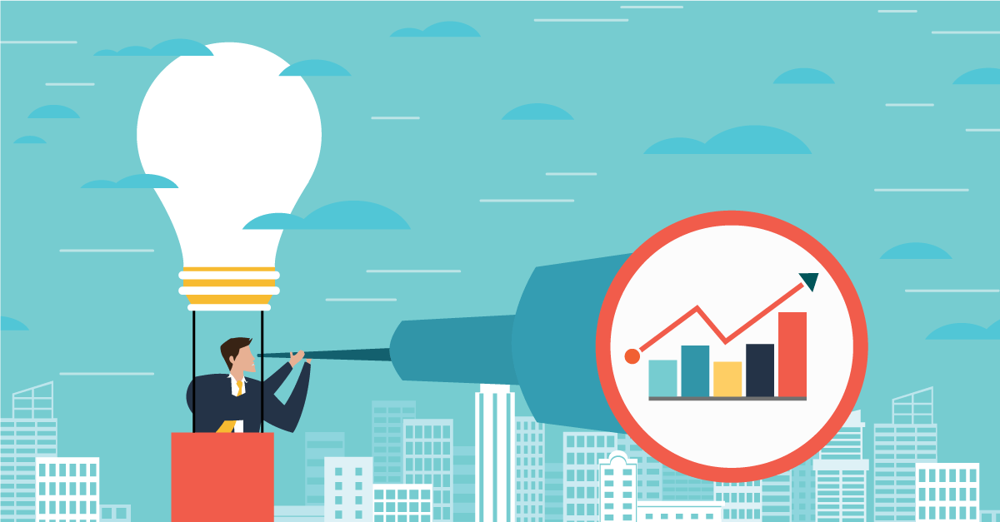



# **1 Introduction**

The M5 competition aims at predicting the sales of different Walmart stores in various locations for a 28-day time period. This competition runs from from March 2, 2020 to 30th of June, 2020. Hierarchical sales data has been provided by Walmart that starts at the item level and aggregates to departments, product categories and stores in three US states: Texas, California, Wisconsin. 

# 2 Overview: File structure and content
- calendar.csv - Contains information about the dates on which the products are sold.
- sales_train_validation.csv - Contains the historical daily unit sales data per product and store [d_1 - d_1913]
- sample_submission.csv - The correct format for submissions. 
- sell_prices.csv - Contains information about the price of the products sold per store and date.
- sales_train_evaluation.csv - Available once month before competition deadline. Will include sales [d_1 - d_1941]

# 3 Preparations

In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import glob
import os
%matplotlib inline
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

for dirname, _, filenames in os.walk('./kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

./kaggle/input/.DS_Store
./kaggle/input/m5-forecasting-accuracy/calendar.csv
./kaggle/input/m5-forecasting-accuracy/predict_sales.png
./kaggle/input/m5-forecasting-accuracy/sell_prices.csv
./kaggle/input/m5-forecasting-accuracy/sales_train_validation.csv
./kaggle/input/m5-forecasting-accuracy/sample_submission.csv


In [3]:
# Function to read all csv files under the same directory
def readallcsv():
    allcsv = glob.glob("./kaggle/input/m5-forecasting-accuracy/*.csv")
    print("The following DataFrame will be created: ")
    for f in allcsv:
        print(f.split('/')[4].split('.')[0])
        globals()[f.split('/')[4].split('.')[0]] = pd.read_csv(f)

# Executing above fuction
readallcsv()

The following DataFrame will be created: 
calendar
sell_prices
sales_train_validation
sample_submission


In [4]:
# adding states and item category column to sell_prices df
sell_prices['state'] = sell_prices.store_id.str.split("_", n = 1, expand = True)[0]
sell_prices['category'] = sell_prices.item_id.str.split("_", n = 1, expand = True)[0]

In [5]:
# Roc's Preparing Dataframe
#joining calendar and sales
joined_df = pd.merge(sell_prices, calendar, on='wm_yr_wk')

In [6]:
calendar.head()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


In [7]:
print(sell_prices.shape)
print(joined_df.shape)

(6841121, 6)
(47735397, 19)


In [8]:
joined_df.head()

,store_id,item_id,wm_yr_wk,sell_price,state,category,date,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,CA_1,HOBBIES_1_001,11325,9.58,CA,HOBBIES,2013-07-13,Saturday,1,7,2013,d_897,NaN,NaN,NaN,NaN,0,1,0
1,CA_1,HOBBIES_1_001,11325,9.58,CA,HOBBIES,2013-07-14,Sunday,2,7,2013,d_898,NaN,NaN,NaN,NaN,0,0,1
2,CA_1,HOBBIES_1_001,11325,9.58,CA,HOBBIES,2013-07-15,Monday,3,7,2013,d_899,NaN,NaN,NaN,NaN,0,1,1
3,CA_1,HOBBIES_1_001,11325,9.58,CA,HOBBIES,2013-07-16,Tuesday,4,7,2013,d_900,NaN,NaN,NaN,NaN,0,0,0
4,CA_1,HOBBIES_1_001,11325,9.58,CA,HOBBIES,2013-07-17,Wednesday,5,7,2013,d_901,NaN,NaN,NaN,NaN,0,0,0


# **4 Individual feature visualisations**

**4.1 Household(Hamza)**

In [16]:
# sell_prices for household
sell_prices[sell_prices.category == 'HOUSEHOLD'].head()

,store_id,item_id,wm_yr_wk,sell_price,state,category
129629,CA_1,HOUSEHOLD_1_001,11101,6.32,CA,HOUSEHOLD
129630,CA_1,HOUSEHOLD_1_001,11102,6.32,CA,HOUSEHOLD
129631,CA_1,HOUSEHOLD_1_001,11103,6.32,CA,HOUSEHOLD
129632,CA_1,HOUSEHOLD_1_001,11104,6.32,CA,HOUSEHOLD
129633,CA_1,HOUSEHOLD_1_001,11105,6.32,CA,HOUSEHOLD


Lets look at the count of each category and state in the price dataframe

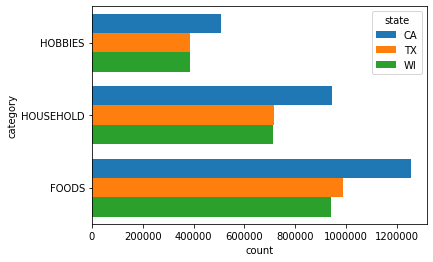

In [13]:
p = sns.countplot(data=sell_prices,
                  y = 'category',
                  hue = 'state',
                  saturation=1)


Looks like California has the max number of items for sale as compared to all other states. Most items are foods.

In [42]:
sell_prices.groupby(['state']).count()

,store_id,item_id,wm_yr_wk,sell_price,category
state,,,,,
CA,2708822,2708822,2708822,2708822,2708822
TX,2092122,2092122,2092122,2092122,2092122
WI,2040177,2040177,2040177,2040177,2040177


In [45]:
sell_prices.groupby(['store_id']).count()

,item_id,wm_yr_wk,sell_price,state,category
store_id,,,,,
CA_1,698412,698412,698412,698412,698412
CA_2,637395,637395,637395,637395,637395
CA_3,693990,693990,693990,693990,693990
CA_4,679025,679025,679025,679025,679025
TX_1,699796,699796,699796,699796,699796
TX_2,701214,701214,701214,701214,701214
TX_3,691112,691112,691112,691112,691112
WI_1,665912,665912,665912,665912,665912
WI_2,678171,678171,678171,678171,678171


#### Data wrangling

Lets look at our sales_train_validation dataset:

In [17]:
sales_train_validation.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


Lets create a melted dataframe where there will be a **day** column representing the specific day in the time series and a **demand** column representing the number of items sold on that day.

In [9]:
sales_train_validation_melt = pd.melt(sales_train_validation, id_vars=['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'], var_name='day', value_name='demand')

In [10]:
sales_train_validation_melt['day'] = sales_train_validation_melt['day'].str.replace('d_','').astype(int)

In [11]:
sales_train_validation_melt.shape

(58327370, 8)

Lets also remove _d from the d column for the calendar dataset.

In [12]:
calendar['d'] = calendar['d'].str.replace('d_','').astype(int)

Lets merge the calendar data to train validation data - 

In [13]:
sales_train_validation_melt_calendar = pd.merge(sales_train_validation_melt, calendar, left_on="day", right_on="d", how="left")
sales_train_validation_melt_calendar.head()

,id,item_id,dept_id,cat_id,store_id,state_id,day,demand,date,wm_yr_wk,...,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,1,2011,1,NaN,NaN,NaN,NaN,0,0,0
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,1,2011,1,NaN,NaN,NaN,NaN,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,1,2011,1,NaN,NaN,NaN,NaN,0,0,0
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,1,2011,1,NaN,NaN,NaN,NaN,0,0,0
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,1,2011,1,NaN,NaN,NaN,NaN,0,0,0


In [14]:
sales_train_validation_melt_calendar.shape

(58327370, 22)

Lets also merge the sell price dataframe to this:

In [15]:
sales_train_validation_melt_calendar = pd.merge(sales_train_validation_melt_calendar, sell_prices, left_on=["store_id", "item_id", "wm_yr_wk"], right_on=["store_id", "item_id", "wm_yr_wk"], how="left")
sales_train_validation_melt_calendar.head()

,id,item_id,dept_id,cat_id,store_id,state_id,day,demand,date,wm_yr_wk,...,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price,state,category
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,1,0,2011-01-29,11101,...,NaN,NaN,NaN,NaN,0,0,0,NaN,NaN,NaN


In [16]:
sales_train_validation_melt_calendar.shape

(58327370, 25)

Lets look at the aggregate sales per day 

[Text(0, 0.5, 'demand')]

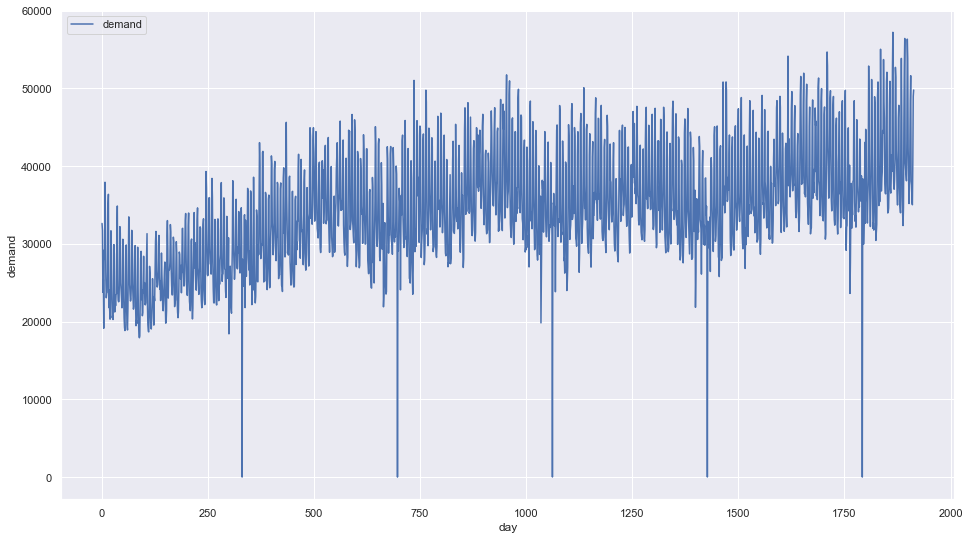

In [78]:
sales_train_validation_melt_calendar_groupby = sales_train_validation_melt_calendar[["day", "demand"]].groupby('day').sum()
plt.figure(figsize = (16,9)) # figure size with ratio 16:9
sns.set(style='darkgrid') # background darkgrid style of graph 
plot = sns.lineplot(data=sales_train_validation_melt_calendar_groupby)
plot.set(ylabel='demand')

For some days the overall demand is pretty low which could be when the stores were closed. Lets see what dates had total demand less than 100.

In [96]:
sales_train_validation_melt_calendar_groupby = pd.merge(sales_train_validation_melt_calendar_groupby, calendar, left_on="day", right_on="d", how="left")

In [100]:
sales_train_validation_melt_calendar_groupby[sales_train_validation_melt_calendar_groupby.demand<100]["date"].str.slice_replace(0, 4, 'YYYY').unique()


array(['YYYY-12-25'], dtype=object)

25th December, makes sense.

Lets now look at the per day sales by category

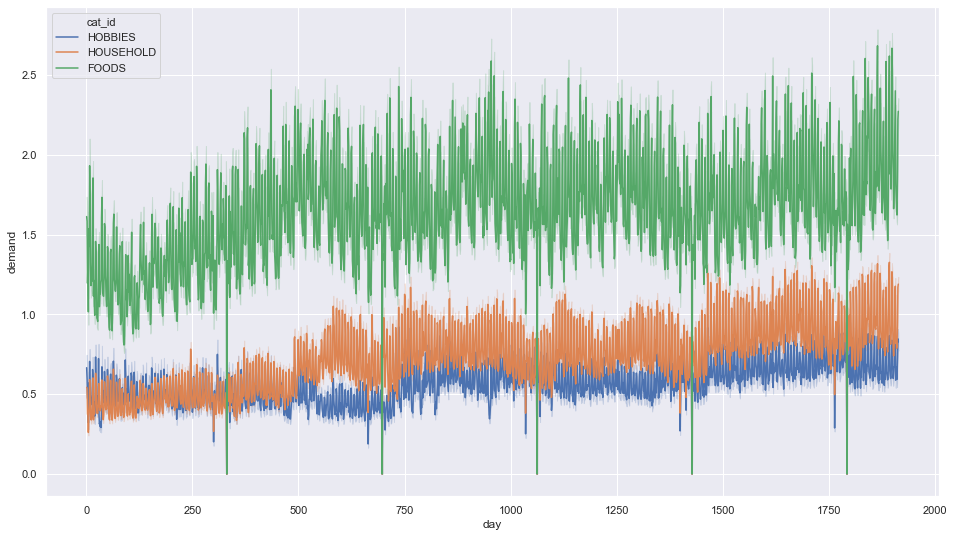

In [42]:
plt.figure(figsize = (16,9)) # figure size with ratio 16:9
sns.set(style='darkgrid',) # background darkgrid style of graph 
sns.lineplot(x="day", y="demand", hue="cat_id", data=sales_train_validation_melt)

Lets now look at the per day sales by state

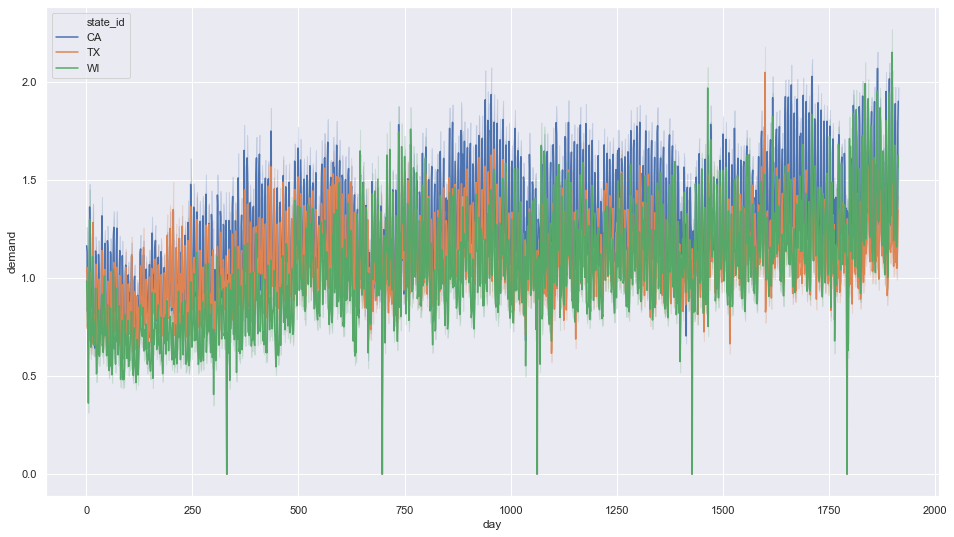

In [51]:
plt.figure(figsize = (16,9)) # figure size with ratio 16:9
sns.set(style='darkgrid',) # background darkgrid style of graph 
sns.lineplot(x="day", y="demand", hue="state_id", data=sales_train_validation_melt)

In [22]:
max_min_mean = sales_train_validation_melt_calendar.groupby("item_id")[["sell_price", "demand"]].agg({
    "demand" : ["max", "mean", "min"],
    "sell_price": ["max", "mean", "min"] 
}).reset_index()

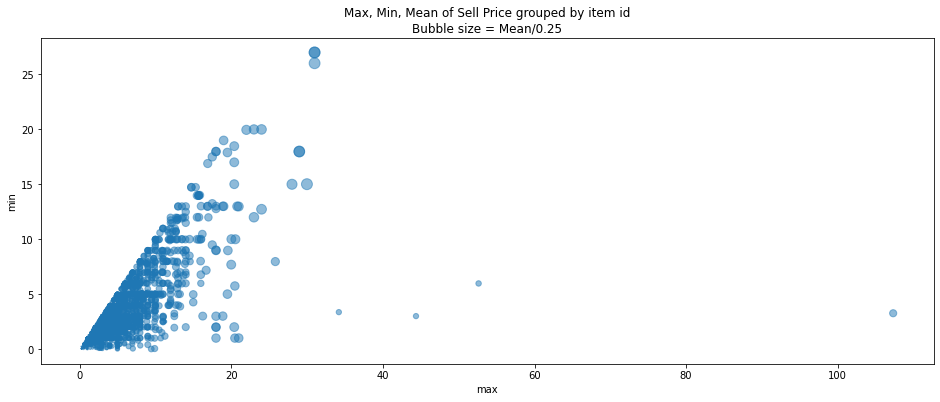

In [23]:
def bubble_scatterplot(x, y, s, title):
    plt.figure(figsize = (16,6)) # figure size with ratio 16:9
    plt.scatter(x=x, 
            y=y, 
            s=s/0.25, 
            alpha=0.5)
    plt.xlabel('max')
    plt.ylabel('min')
    plt.title(title)
    plt.show()
    
bubble_scatterplot(max_min_mean ["sell_price", "max"], 
                   max_min_mean ["sell_price", "min"], 
                   max_min_mean ["sell_price", "mean"],
                  'Max, Min, Mean of Sell Price grouped by item id\nBubble size = Mean/0.25')    

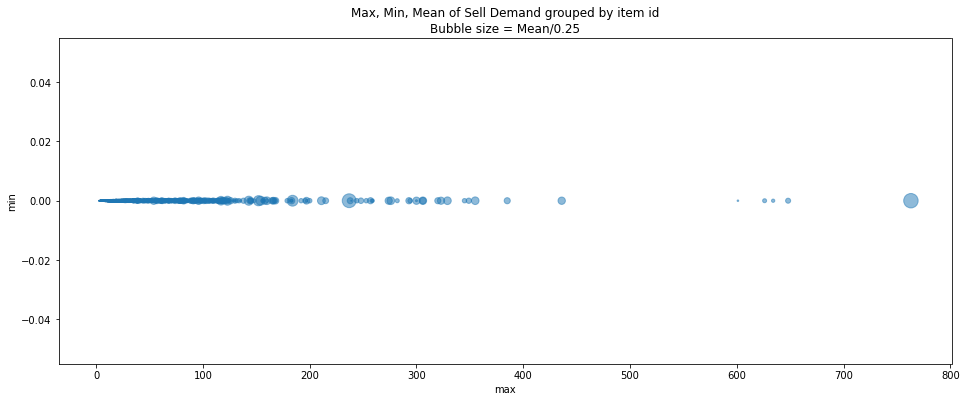

In [24]:
bubble_scatterplot(max_min_mean ["demand", "max"], 
                   max_min_mean ["demand", "min"], 
                   max_min_mean ["demand", "mean"],
                  'Max, Min, Mean of Sell Demand grouped by item id\nBubble size = Mean/0.25')   

In [ ]:
events = new_CA_1[~new_CA_1.event_name_1.isna()]
events = events.groupby("event_name_1")[["demand", "sell_price"]].agg(["mean", "max"]).reset_index()
events.columns = ['_'.join(col).strip() for col in events.columns.values]

Lets look at max, min and mean of sell prices and demand for events

In [17]:
sales_train_validation_melt_calendar[(sales_train_validation_melt_calendar.event_name_1.isna()) & (sales_train_validation_melt_calendar.event_name_2.notna())]

,id,item_id,dept_id,cat_id,store_id,state_id,day,demand,date,wm_yr_wk,...,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price,state,category


As no event_name_1 is null when event_name_2 is not null, we can use event_name_1 and see its effect on demand and sell_price

In [233]:
event_max_min_mean = sales_train_validation_melt_calendar.groupby("event_name_1")[["sell_price", "demand"]].agg({
    "demand" : ["max", "mean", "min"],
    "sell_price": ["max", "mean", "min"] 
}).reset_index()

In [234]:
event_max_min_mean.columns = event_max_min_mean.columns.map('_'.join)

In [235]:
event_max_min_mean = event_max_min_mean.reset_index()

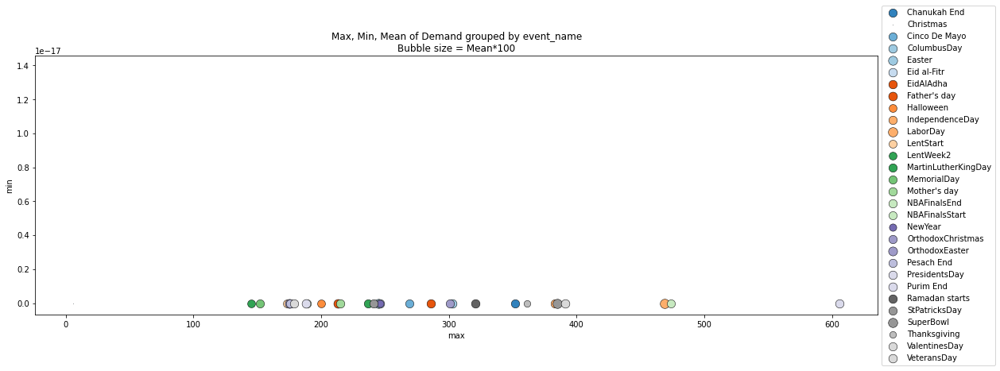

In [236]:
from matplotlib.axes._axes import _log as matplotlib_axes_logger
matplotlib_axes_logger.setLevel('ERROR')

def catbubble_scatterplot(x, y, z, cat, data, multiplier, title):
    plt.figure(figsize = (19,6)) # figure size with ratio 16:9
    categories = np.unique(data[cat])
    colors = [plt.cm.tab20c(i/float(len(categories)-1)) for i in range(len(categories))]

    event_max_min_mean[z] = data[z]*multiplier
    for i, category in enumerate(data[cat]):
        plt.scatter(x, y, data=data.loc[data.event_name_1_==category, :], s=z, c=colors[i], label=str(category), edgecolors='black', linewidths=.5)   

    plt.xlabel('max')
    plt.ylabel('min')
    plt.title(title)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()  

catbubble_scatterplot("demand_max", "demand_min", "demand_mean", "event_name_1_", event_max_min_mean, 100, "Max, Min, Mean of Demand grouped by event_name\nBubble size = Mean*100")

Mininum demand is around zero, while there is considerable variance in max demand for different event days. The mean value for demand doesn't vary a lot except for Christmas and Thanksgiving.

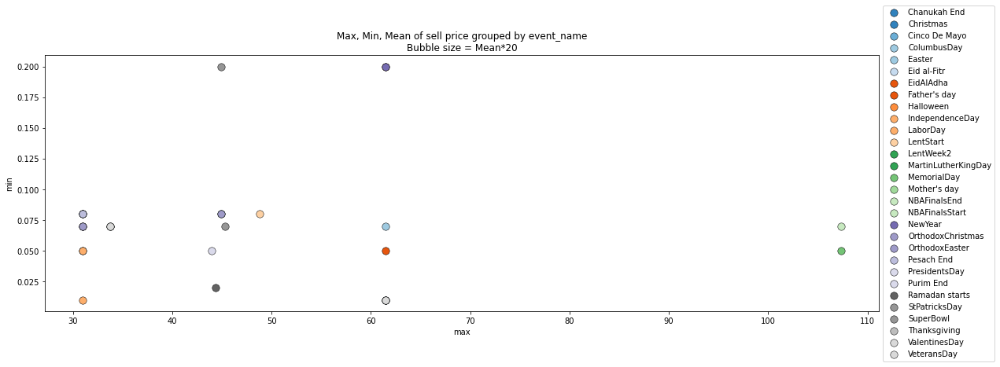

In [237]:
catbubble_scatterplot("sell_price_max", "sell_price_min", "sell_price_mean", "event_name_1_", event_max_min_mean, 20, "Max, Min, Mean of sell price grouped by event_name\nBubble size = Mean*20")

Minimum sell price doesn't vary a lot while there is some variance in max sell price across different events. The mean  sell price is similar for all events.

Lets create a subset of the data for further EDA. We have taken the last 20k rows as our test set and the 80k rows before it as our training set

In [6]:
sales_train_validation_melt.tail(100)
df_test = sales_train_validation_melt.tail(20000) 
df_train = sales_train_validation_melt.iloc[-100000:-20000] 
display(df_train.tail())
display(df_test.head())

,id,item_id,dept_id,cat_id,store_id,state_id,day,demand
58307365,HOUSEHOLD_2_243_CA_4_validation,HOUSEHOLD_2_243,HOUSEHOLD_2,HOUSEHOLD,CA_4,CA,1913,0
58307366,HOUSEHOLD_2_244_CA_4_validation,HOUSEHOLD_2_244,HOUSEHOLD_2,HOUSEHOLD,CA_4,CA,1913,0
58307367,HOUSEHOLD_2_245_CA_4_validation,HOUSEHOLD_2_245,HOUSEHOLD_2,HOUSEHOLD,CA_4,CA,1913,0
58307368,HOUSEHOLD_2_246_CA_4_validation,HOUSEHOLD_2_246,HOUSEHOLD_2,HOUSEHOLD,CA_4,CA,1913,0
58307369,HOUSEHOLD_2_247_CA_4_validation,HOUSEHOLD_2_247,HOUSEHOLD_2,HOUSEHOLD,CA_4,CA,1913,3


,id,item_id,dept_id,cat_id,store_id,state_id,day,demand
58307370,HOUSEHOLD_2_248_CA_4_validation,HOUSEHOLD_2_248,HOUSEHOLD_2,HOUSEHOLD,CA_4,CA,1913,2
58307371,HOUSEHOLD_2_249_CA_4_validation,HOUSEHOLD_2_249,HOUSEHOLD_2,HOUSEHOLD,CA_4,CA,1913,0
58307372,HOUSEHOLD_2_250_CA_4_validation,HOUSEHOLD_2_250,HOUSEHOLD_2,HOUSEHOLD,CA_4,CA,1913,0
58307373,HOUSEHOLD_2_251_CA_4_validation,HOUSEHOLD_2_251,HOUSEHOLD_2,HOUSEHOLD,CA_4,CA,1913,0
58307374,HOUSEHOLD_2_252_CA_4_validation,HOUSEHOLD_2_252,HOUSEHOLD_2,HOUSEHOLD,CA_4,CA,1913,0


Our split worked as the tail of the train set continues into the head of the test set.

In [22]:
import plotly.graph_objects as go
def interactive_line_plot(melted_df, label_var, xaxis, yaxis):
    """
    Plots an interactive time series line plot

    Parameters
    ----------
    melted_df : pd.Dataframe
        dataframe with a column for days, demand and a 
        categorical for separate visualisation
    
    label_var: str
        the categorical column name to separate time series
        visualisation
        
    xaxis: str
        xaxis column (day)
        
    yaxis: str
        yaxis column (demand)    
 
    Returns
    -------
    None
        
    """    
    # Initialize figure
    fig = go.Figure()
    button_list = []
    nunique = melted_df[label_var].nunique()*2
    i=0
    for category in melted_df[label_var].unique():
        melted_df_cat = melted_df[melted_df[label_var]==category]
        # Add Traces 
        fig.add_trace(
            go.Scatter(x=list(melted_df_cat[xaxis]),
                   y=list(melted_df_cat[yaxis]),
                   name=category,
                   ))
        fig.add_trace(
            go.Scatter(x=list(melted_df_cat[xaxis]),
                  y=[melted_df_cat[yaxis].mean()] * len(melted_df_cat[xaxis]),
                  name=f"Average {category}",
                  visible=False,
                  line=dict(dash="dash")))
        high_annotations = [dict(x=melted_df_cat[xaxis].max(),
                         y=melted_df_cat[yaxis].mean(),
                         xref="x", yref="y",
                         text="Average:<br> %.3f" % melted_df_cat[yaxis].mean(),
                         ax=0, ay=0,
                         ),
                    dict(x=melted_df_cat.loc[melted_df_cat[yaxis]==melted_df_cat[yaxis].max(), xaxis].unique().min(),
                         y=melted_df_cat[yaxis].max(),
                         xref="x", yref="y",
                         text="Max:<br> %.3f" % melted_df_cat[yaxis].max(),
                         ax=0, ay=0,
                         )]
        
        visibility_list = [False]*nunique
        visibility_list[i]=True
        visibility_list[i+1]=True
        i+=2
        button_list.append(dict(label=category,
                         method="update",
                         args=[{"visible": visibility_list },
                               {"title": f"{category} {yaxis} time series",
                                "annotations": high_annotations}]))

    button_list.append(dict(label="All Categories",
                         method="update",
                         args=[{"visible": [True]*nunique },
                               {"title": f"All categories {yaxis} time series",
                                "annotations": []}]))      
    fig.update_layout(
        updatemenus=[
            dict(
                    active=0,
                    buttons=button_list
                )
            ])    

    # Set title
    fig.update_layout(title_text="Demand Vs Time", 
                     xaxis_title=xaxis,
                     yaxis_title=yaxis,
                     xaxis={'tickformat': ',d'}, 
        font=dict(
            family="Courier New, monospace",
            size=12,
            color="#7f7f7f",
        ))
    fig.show()
      

Lets look at this training subset by category

In [23]:
fig=interactive_line_plot(df_train, "cat_id", "day", "demand") 

Lets look at this training subset by state

In [24]:
interactive_line_plot(df_train, "state_id", "day", "demand") 

## To be continued

In [10]:
display(sell_prices.columns)
display(sample_submission.columns)
display(calendar.columns)
display(sales_train_validation.columns)

Index(['store_id', 'item_id', 'wm_yr_wk', 'sell_price', 'state', 'category'], dtype='object')

Index(['id', 'F1', 'F2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'F9', 'F10',
       'F11', 'F12', 'F13', 'F14', 'F15', 'F16', 'F17', 'F18', 'F19', 'F20',
       'F21', 'F22', 'F23', 'F24', 'F25', 'F26', 'F27', 'F28'],
      dtype='object')

Index(['date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'd',
       'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2',
       'snap_CA', 'snap_TX', 'snap_WI'],
      dtype='object')

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd_1',
       'd_2', 'd_3', 'd_4',
       ...
       'd_1904', 'd_1905', 'd_1906', 'd_1907', 'd_1908', 'd_1909', 'd_1910',
       'd_1911', 'd_1912', 'd_1913'],
      dtype='object', length=1919)

**4.2 Foods(Roc)**

In [7]:
# sell_prices for foods
sell_prices[sell_prices.category == 'FOODS']

,store_id,item_id,wm_yr_wk,sell_price,state,category
368746,CA_1,FOODS_1_001,11101,2.0,CA,FOODS
368747,CA_1,FOODS_1_001,11102,2.0,CA,FOODS
368748,CA_1,FOODS_1_001,11103,2.0,CA,FOODS
368749,CA_1,FOODS_1_001,11104,2.0,CA,FOODS
368750,CA_1,FOODS_1_001,11105,2.0,CA,FOODS
...,...,...,...,...,...,...
6841116,WI_3,FOODS_3_827,11617,1.0,WI,FOODS
6841117,WI_3,FOODS_3_827,11618,1.0,WI,FOODS
6841118,WI_3,FOODS_3_827,11619,1.0,WI,FOODS
6841119,WI_3,FOODS_3_827,11620,1.0,WI,FOODS


4.3 Hobbies(Steven)

In [8]:
# sell_prices for food
sell_prices[sell_prices.category == 'HOBBIES']

,store_id,item_id,wm_yr_wk,sell_price,state,category
0,CA_1,HOBBIES_1_001,11325,9.58,CA,HOBBIES
1,CA_1,HOBBIES_1_001,11326,9.58,CA,HOBBIES
2,CA_1,HOBBIES_1_001,11327,8.26,CA,HOBBIES
3,CA_1,HOBBIES_1_001,11328,8.26,CA,HOBBIES
4,CA_1,HOBBIES_1_001,11329,8.26,CA,HOBBIES
...,...,...,...,...,...,...
6274446,WI_3,HOBBIES_2_149,11617,0.97,WI,HOBBIES
6274447,WI_3,HOBBIES_2_149,11618,0.97,WI,HOBBIES
6274448,WI_3,HOBBIES_2_149,11619,0.97,WI,HOBBIES
6274449,WI_3,HOBBIES_2_149,11620,0.97,WI,HOBBIES
